### Import libraries

In [3]:
import sys
import numpy as np
import tensorflow as tf
import librosa
import os
from IPython.display import Audio, display
import matplotlib.pyplot as plt
%matplotlib inline

/usr/local/opt/python@2/bin/python2.7


ImportError: No module named librosa

### Load style and content

In [111]:
CONTENT_FILENAME = "inputs/bensound-ukulele.mp3"
STYLE_FILENAME = "inputs/fire.mp3"

In [112]:
display(Audio(CONTENT_FILENAME))
display(Audio(STYLE_FILENAME))

In [113]:
# Reads wav file and produces spectrum
# Fourier phases are ignored
N_FFT = 2048
def read_audio_spectum(filename):
    x, fs = librosa.load(filename)
    S = librosa.stft(x, N_FFT)
    S = np.log1p(np.abs(S[:,:430]))  
    return S, fs

In [114]:
a_content, fs = read_audio_spectum(CONTENT_FILENAME)
print fs
a_style, fs = read_audio_spectum(STYLE_FILENAME)
print fs
N_SAMPLES = a_content.shape[1]
N_CHANNELS = a_content.shape[0]
a_style = a_style[:N_CHANNELS, :N_SAMPLES]

22050
22050


### Visualize spectrograms for content and style tracks

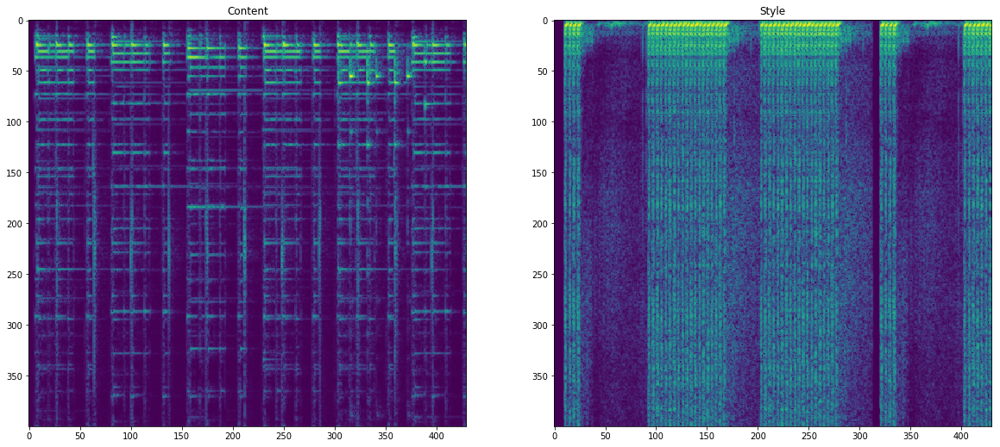

430
1025


In [115]:
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title('Content')
plt.imshow(a_content[:400,:])
plt.subplot(1, 2, 2)
plt.title('Style')
plt.imshow(a_style[:400,:])
plt.show()
print N_SAMPLES
print N_CHANNELS

### Compute content and style feats

In [116]:
N_FILTERS = 4096

a_content_tf = np.ascontiguousarray(a_content.T[None,None,:,:])
a_style_tf = np.ascontiguousarray(a_style.T[None,None,:,:])

# filter shape is "[filter_height, filter_width, in_channels, out_channels]"
std = np.sqrt(2) * np.sqrt(2.0 / ((N_CHANNELS + N_FILTERS) * 11))
print std
kernel = np.random.randn(1, 11, N_CHANNELS, N_FILTERS)*std
print kernel.shape
    
g = tf.Graph()
with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:
    # data shape is "[batch, in_height, in_width, in_channels]",
    x = tf.placeholder('float32', [1,1,N_SAMPLES,N_CHANNELS], name="x")

    kernel_tf = tf.constant(kernel, name="kernel", dtype='float32')
    conv = tf.nn.conv2d(
        x,
        kernel_tf,
        strides=[1, 1, 1, 1],
        padding="VALID",
        name="conv")
    
    net = tf.nn.relu(conv)

    content_features = net.eval(feed_dict={x: a_content_tf})
    style_features = net.eval(feed_dict={x: a_style_tf})
    
    features = np.reshape(style_features, (-1, N_FILTERS))
    style_gram = np.matmul(features.T, features) / N_SAMPLES

0.008426675403448254
(1, 11, 1025, 4096)


### Optimize

Started optimization.
INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 6467.546875
  Number of iterations: 50
  Number of functions evaluations: 61
i: 0 Interim loss: 6467.547
outputs/out0.wav


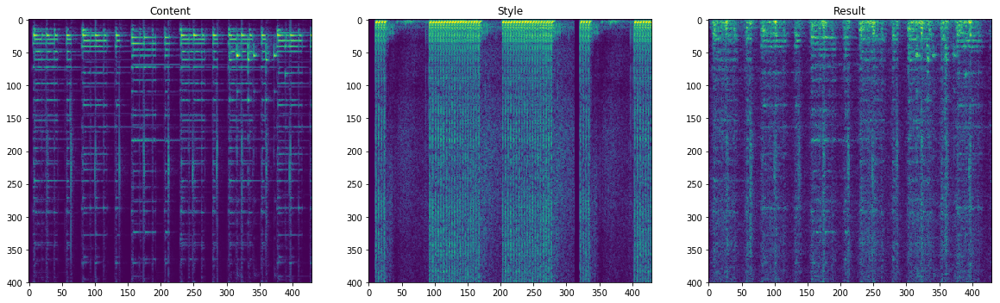

INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 6459.831055
  Number of iterations: 50
  Number of functions evaluations: 51
i: 1 Interim loss: 6459.831
outputs/out1.wav


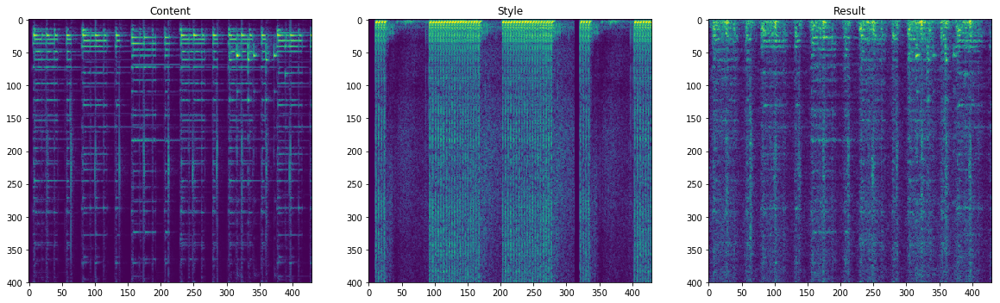

INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 6458.646484
  Number of iterations: 50
  Number of functions evaluations: 52
i: 2 Interim loss: 6458.6465
outputs/out2.wav


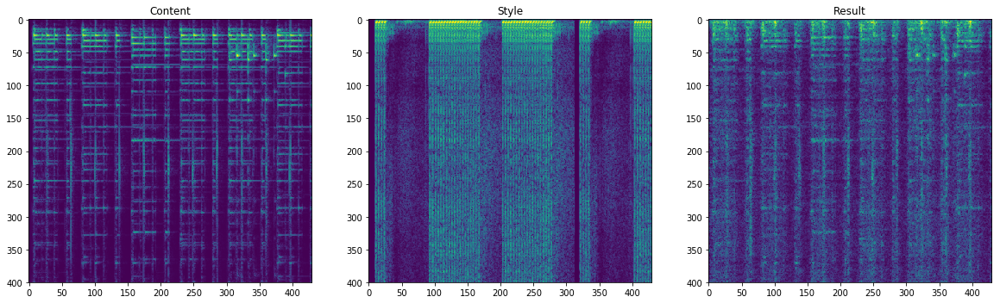

INFO:tensorflow:Optimization terminated with:
  Message: STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
  Objective function value: 6458.183105
  Number of iterations: 50
  Number of functions evaluations: 52
i: 3 Interim loss: 6458.183
outputs/out3.wav


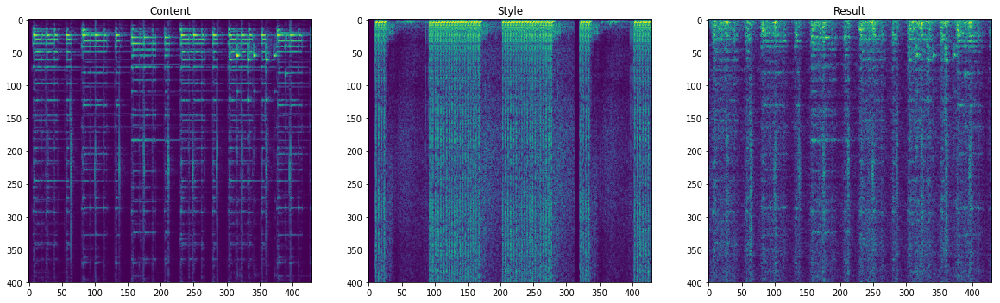

KeyboardInterrupt: 

In [118]:
from sys import stderr

ALPHA= 1e-2
BETA = 1e-2
learning_rate= 1e-3
iterations = 100

def callback(interim_result, step):
    a = np.zeros_like(a_content)
    a[:N_CHANNELS,:] = np.exp(interim_result[0,0].T) - 1

    # This code is supposed to do phase reconstruction
    p = 2 * np.pi * np.random.random_sample(a.shape) - np.pi
    for i in range(500):
        S = a * np.exp(1j*p)
        x = librosa.istft(S)
    
    OUTPUT_FILENAME = 'outputs/out'+str(step)+'.wav'
    librosa.output.write_wav(OUTPUT_FILENAME, x, fs)
    print OUTPUT_FILENAME
    a_result, fs2 = read_audio_spectum(OUTPUT_FILENAME)
    display(Audio(OUTPUT_FILENAME))
    plt.figure(figsize=(20, 20))
    plt.subplot(1,3,1)
    plt.title('Content')
    plt.imshow(a_content[:400,:])
    plt.subplot(1,3,2)
    plt.title('Style')
    plt.imshow(a_style[:400,:])
    plt.subplot(1,3,3)
    plt.title('Result')
    plt.imshow(a_result[:400,:])
    plt.show()
    

result = None
interim_result = None
with tf.Graph().as_default():

    # Build graph with variable input
    x = tf.Variable(np.random.randn(1,1,N_SAMPLES,N_CHANNELS).astype(np.float32)*1e-3, name="x")

    kernel_tf = tf.constant(kernel, name="kernel", dtype='float32')
    conv = tf.nn.conv2d(
        x,
        kernel_tf,
        strides=[1, 1, 1, 1],
        padding="VALID",
        name="conv")
    
    
    net = tf.nn.relu(conv)

    content_loss = ALPHA * 2 * tf.nn.l2_loss(
            net - content_features)

    style_loss = 0

    _, height, width, number = map(lambda i: i.value, net.get_shape())

    size = height * width * number
    feats = tf.reshape(net, (-1, number))
    gram = tf.matmul(tf.transpose(feats), feats)  / N_SAMPLES
    style_loss = BETA * 2 * tf.nn.l2_loss(gram - style_gram)

     # Overall loss
    loss = content_loss + style_loss

    opt = tf.contrib.opt.ScipyOptimizerInterface(
          loss, method='L-BFGS-B', options={'maxiter': 50})
        
    # Optimization
    with tf.Session() as sess:
        
        sess.run(tf.global_variables_initializer())
       
        print('Started optimization.')
        #opt.minimize(sess)
        
        EPOCH_COUNT = 10
        for i in range(EPOCH_COUNT):
            opt.minimize(sess)
            print 'i:' , i , 'Interim loss:', loss.eval()
            interim_result = x.eval()
            callback(interim_result, i)
                
    
        print 'Final loss:', loss.eval()
        result = x.eval()
        print 'Final result:', result
    


### Invert spectrogram and save the result

In [75]:
a = np.zeros_like(a_content)
a[:N_CHANNELS,:] = np.exp(result[0,0].T) - 1

# This code is supposed to do phase reconstruction
p = 2 * np.pi * np.random.random_sample(a.shape) - np.pi
for i in range(500):
    S = a * np.exp(1j*p)
    x = librosa.istft(S)

OUTPUT_FILENAME = 'outputs/out-full.wav'
librosa.output.write_wav(OUTPUT_FILENAME, x, fs)

In [76]:
print OUTPUT_FILENAME
a_result, fs = read_audio_spectum(OUTPUT_FILENAME)
display(Audio(OUTPUT_FILENAME))

outputs/out-full.wav


### Visualize spectrograms

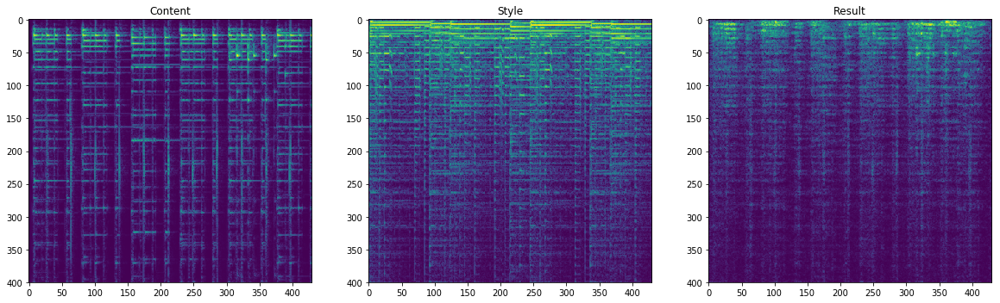

In [77]:
plt.figure(figsize=(20, 20))
plt.subplot(1,3,1)
plt.title('Content')
plt.imshow(a_content[:400,:])
plt.subplot(1,3,2)
plt.title('Style')
plt.imshow(a_style[:400,:])
plt.subplot(1,3,3)
plt.title('Result')
plt.imshow(a_result[:400,:])
plt.show()